In [1]:
import pandas as pd
import numpy as np
import sqlite3
import sys
from sqlalchemy import create_engine
import seaborn as sns
import matplotlib.pyplot as plt

engine = create_engine("sqlite:///courses_2.db")
courses = pd.read_sql('''
SELECT * FROM courses;''', engine)
engine = create_engine("sqlite:///hrefs.db")
hrefs = pd.read_sql('''
SELECT * FROM hrefs;''', engine)
engine = create_engine("sqlite:///institutions.db")
institutions = pd.read_sql('''
SELECT * FROM institutions;''', engine)

courses['earnings_15m'] = pd.to_numeric(courses['earnings_15m'], downcast="float", errors='coerce')
courses['earnings_3y'] = pd.to_numeric(courses['earnings_3y'], downcast="float", errors='coerce')
courses['earnings_5y'] = pd.to_numeric(courses['earnings_5y'], downcast="float", errors='coerce')


In [91]:
courses.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47342 entries, 0 to 47341
Data columns (total 40 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   href               47342 non-null  object 
 1   study_mode         47342 non-null  int64  
 2   study_length       41531 non-null  float64
 3   distance_learning  47342 non-null  int64  
 4   placement_year     47342 non-null  int64  
 5   abroad_year        47342 non-null  object 
 6   foundation_year    47342 non-null  int64  
 7   satisfaction       41491 non-null  float64
 8   teaching_1         41491 non-null  float64
 9   teaching_2         41491 non-null  float64
 10  teaching_3         41491 non-null  float64
 11  teaching_4         41491 non-null  float64
 12  opportunities_1    41491 non-null  float64
 13  opportunities_2    41491 non-null  float64
 14  opportunities_3    41491 non-null  float64
 15  feedback_1         41491 non-null  float64
 16  feedback_2         414

In [55]:
hrefs['institution'] = hrefs['href'].apply(lambda x: x.split('/')[2])
courses = courses.merge(hrefs.merge(institutions)[['href','longitude','latitude','Total']],how='left')

In [73]:
courses.dropna(subset=['satisfaction','usefulness','study_length'],inplace=True)

In [85]:
courses['study_mode'].value_counts(dropna=False)

1    41531
0     5811
Name: study_mode, dtype: int64

In [96]:
courses['study_mode'] = courses['study_mode'].apply(
    lambda x: {'Part time': 0, 
               'Full time': 1
              }.get(x))


In [74]:
courses['study_length'].value_counts(dropna=False)

4.0    15783
3.0    14436
5.0     1990
2.0      308
6.0       38
1.0        6
7.0        1
Name: study_length, dtype: int64

In [97]:
courses['study_length'] = courses['study_length'].apply(
    lambda x: {'1 year course': 1,
               '2 year course': 2,
               '3 year course': 3,
               '4 year course': 4,
               '5 year course': 5,
               '6 year course': 6,
               '7 year course': 7,

              }.get(x))


In [50]:
courses['distance_learning'].value_counts(dropna=False)

0    46088
1     1254
Name: distance_learning, dtype: int64

In [98]:
courses['distance_learning'] = courses['distance_learning'].apply(
    lambda x: {'Not Available': 0, 
               'Compulsory': 1, 
               'Optional': 0,
               'Yes': 1
              }.get(x))


In [92]:
courses['abroad_year'].value_counts(dropna=False)

Not Available    27650
Optional         13462
Compulsory        6230
Name: abroad_year, dtype: int64

In [99]:
courses['abroad_year'] = courses['abroad_year'].apply(
    lambda x: {'Not Available': 0, 
               'Compulsory': 1, 
               'Optional': 0,
              }.get(x))


In [63]:
courses['placement_year'].value_counts(dropna=False)

0    32823
1    14519
Name: placement_year, dtype: int64

In [100]:
courses['placement_year'] = courses['placement_year'].apply(
    lambda x: {'Not Available': 0, 
               'Compulsory': 1, 
               'Optional': 0
              }.get(x))


In [101]:
courses['foundation_year'].value_counts(dropna=False)

Not Available    32796
Part time         5811
Compulsory        5388
Optional          3347
Name: foundation_year, dtype: int64

In [102]:
courses['foundation_year'] = courses['foundation_year'].apply(
    lambda x: {'Not Available': 0, 
               'Compulsory': 1, 
               'Optional': 0,
               'Part time': 1,
              }.get(x))


In [ ]:
courses[courses['2'].isna()].count()

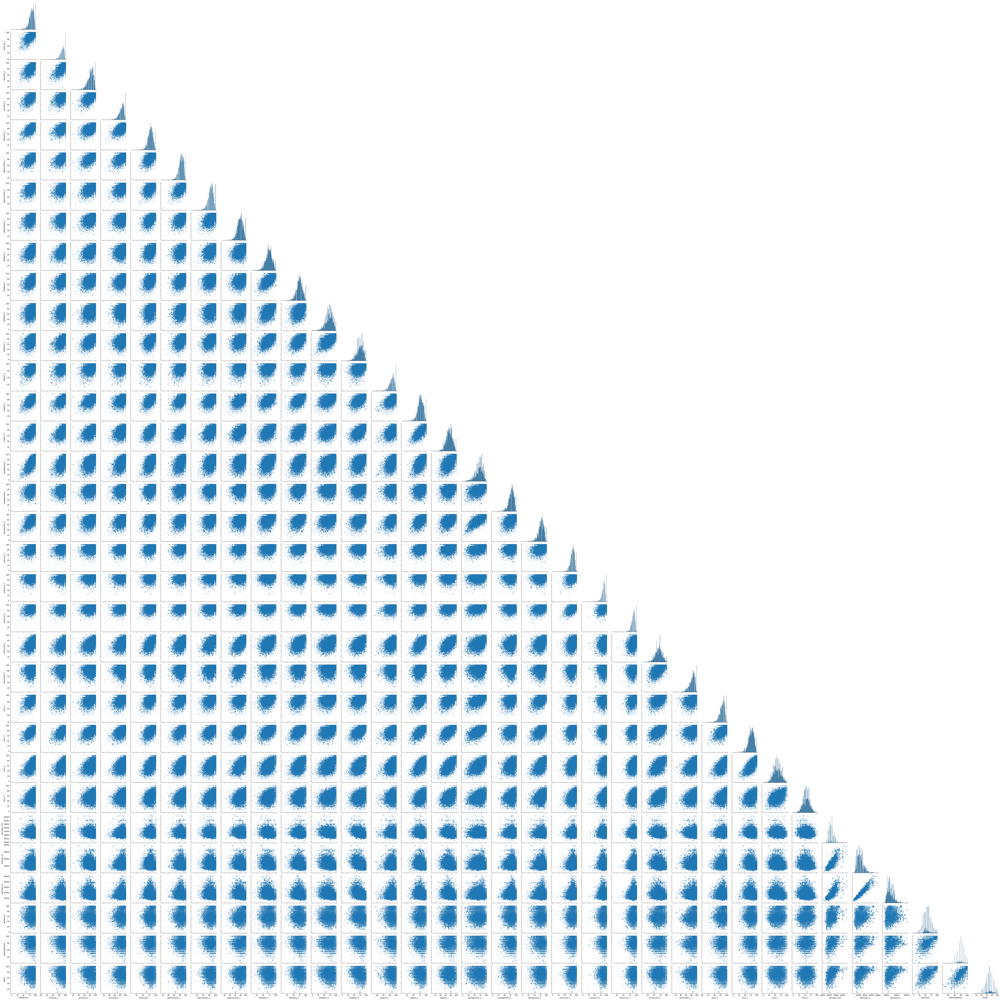

In [16]:
eda_1 = sns.pairplot(courses[[
    'satisfaction',
    'teaching_1',
    'teaching_2',
    'teaching_3',
    'teaching_4',
    'opportunities_1',
    'opportunities_2',
    'opportunities_3',
    'feedback_1',
    'feedback_2',
    'feedback_3',
    'feedback_4',
    'support_1',
    'support_2',
    'support_3',
    'management_1',
    'management_2',
    'management_3',
    'resources_1',
    'resources_2',
    'resources_3',
    'community_1',
    'community_2',
    'voice_1',
    'voice_2',
    'voice_3',
    'voice_4',#33
    
    'earnings_15m',#34
    'earnings_3y',
    'earnings_5y',
    
    'usefulness',#37
    'meaningfulness',
    'future',]], plot_kws=dict(alpha=.1, edgecolor='none'),corner=True)
eda_1.savefig("pairplot_3.png")

<AxesSubplot:>

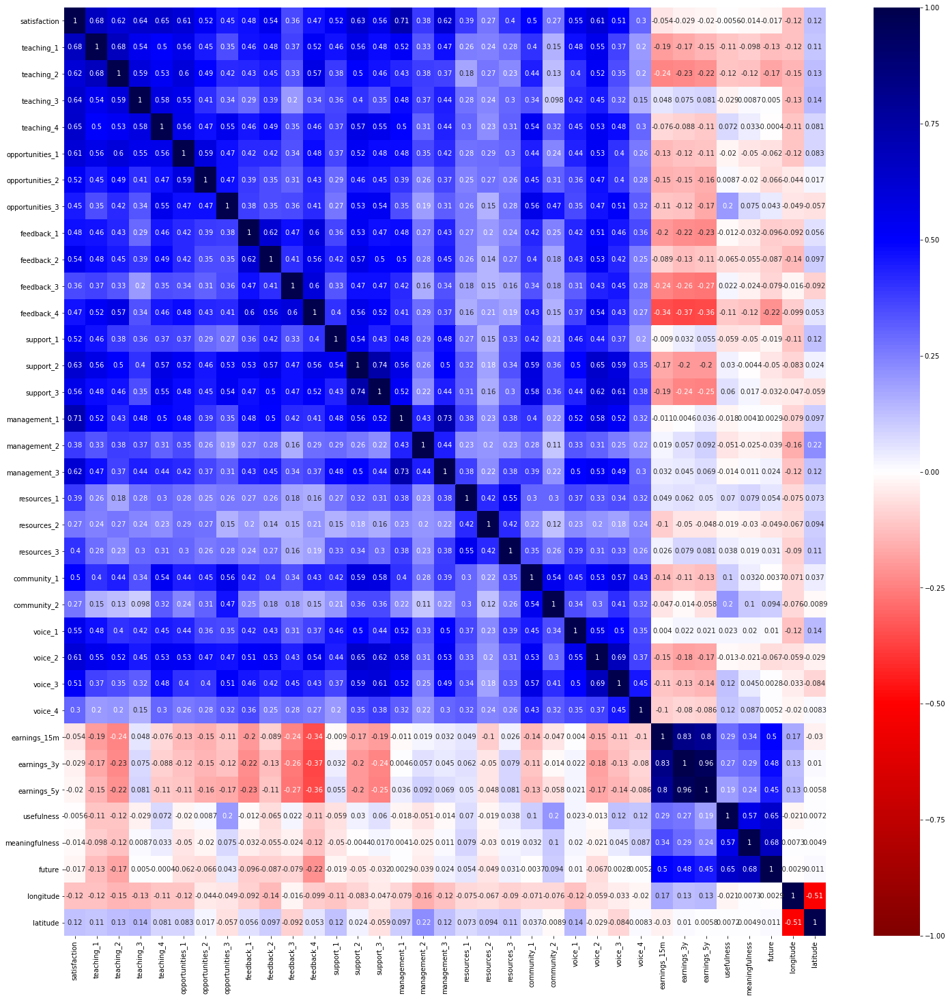

In [28]:
plt.figure(figsize=(25,25))
sns.heatmap(courses[[
    'satisfaction',
    'teaching_1',
    'teaching_2',
    'teaching_3',
    'teaching_4',
    'opportunities_1',
    'opportunities_2',
    'opportunities_3',
    'feedback_1',
    'feedback_2',
    'feedback_3',
    'feedback_4',
    'support_1',
    'support_2',
    'support_3',
    'management_1',
    'management_2',
    'management_3',
    'resources_1',
    'resources_2',
    'resources_3',
    'community_1',
    'community_2',
    'voice_1',
    'voice_2',
    'voice_3',
    'voice_4',#33
    
    'earnings_15m',#34
    'earnings_3y',
    'earnings_5y',
    
    'usefulness',#37
    'meaningfulness',
    'future',
    'longitude',
    'latitude'
]].corr(), cmap="seismic_r", annot=True, vmin=-1, vmax=1)


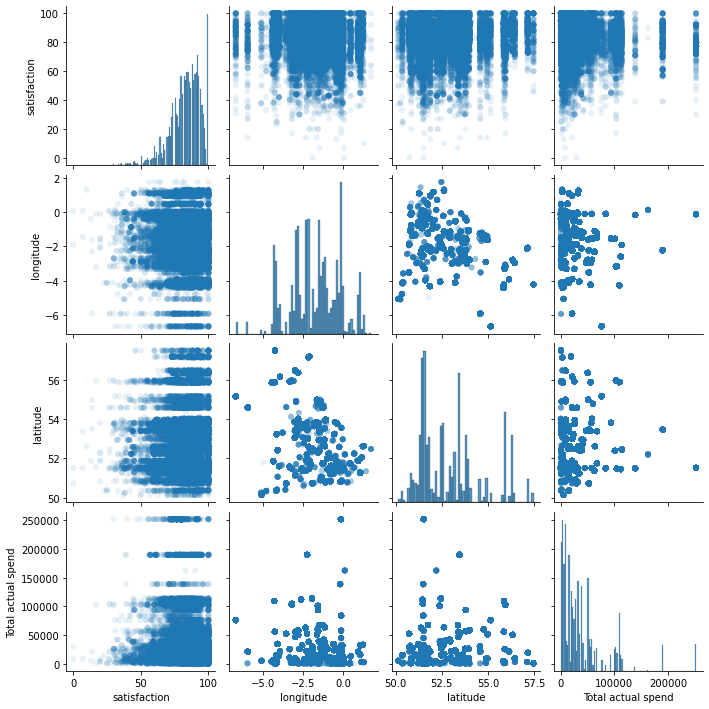

In [49]:
eda_1 = sns.pairplot(courses[[
    'satisfaction',
    'longitude',
    'latitude',
    'Total actual spend'
]], plot_kws=dict(alpha=.1, edgecolor='none'))
eda_1.savefig("pairplot_5.png")

In [9]:
courses['teaching'] = courses['teaching_1'] + courses['teaching_2'] + courses['teaching_3'] + courses['teaching_4']
courses['opportunities'] = courses['opportunities_1'] + courses['opportunities_2'] + courses['opportunities_3']
courses['feedback'] = courses['feedback_1'] + courses['feedback_2'] + courses['feedback_3'] + courses['feedback_4']
courses['support'] = courses['support_1'] + courses['support_2'] + courses['support_3']
courses['management'] = courses['management_1'] + courses['management_2'] + courses['management_3']
courses['resources'] = courses['resources_1'] + courses['resources_2'] + courses['resources_3']
courses['community'] = courses['community_1'] + courses['community_2'] 
courses['voice'] = courses['voice_1'] + courses['voice_2'] + courses['voice_3'] + courses['voice_4']

In [32]:
courses['everything'] = (
    courses['teaching_1'] + courses['teaching_2'] + courses['teaching_3'] + courses['teaching_4']
    + courses['opportunities_1'] + courses['opportunities_2'] + courses['opportunities_3']
    + courses['feedback_1'] + courses['feedback_2'] + courses['feedback_3'] + courses['feedback_4']
    + courses['support_1'] + courses['support_2'] + courses['support_3']
    + courses['management_1'] + courses['management_2'] + courses['management_3']
    + courses['resources_1'] + courses['resources_2'] + courses['resources_3']
    + courses['community_1'] + courses['community_2'] 
    + courses['voice_1'] + courses['voice_2'] + courses['voice_3'] + courses['voice_4']
)

<AxesSubplot:>

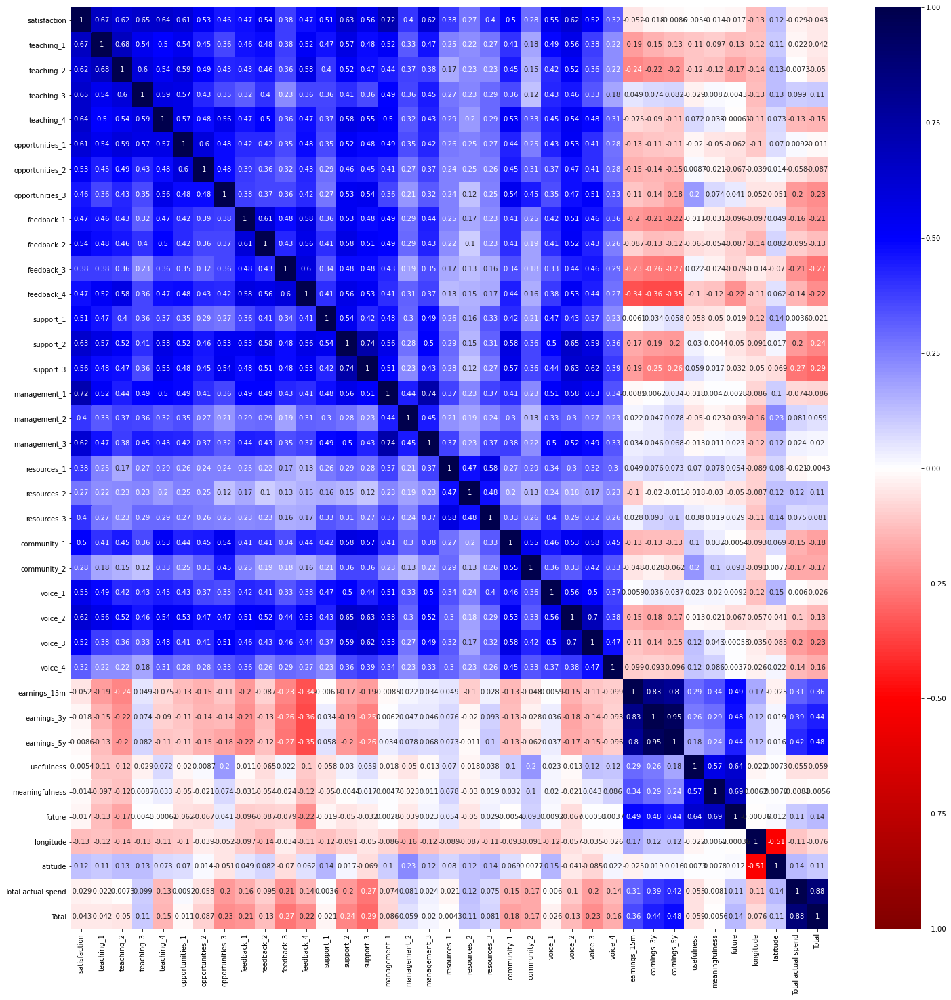

In [56]:
plt.figure(figsize=(25,25))
sns.heatmap(courses.corr(), cmap="seismic_r", annot=True, vmin=-1, vmax=1)


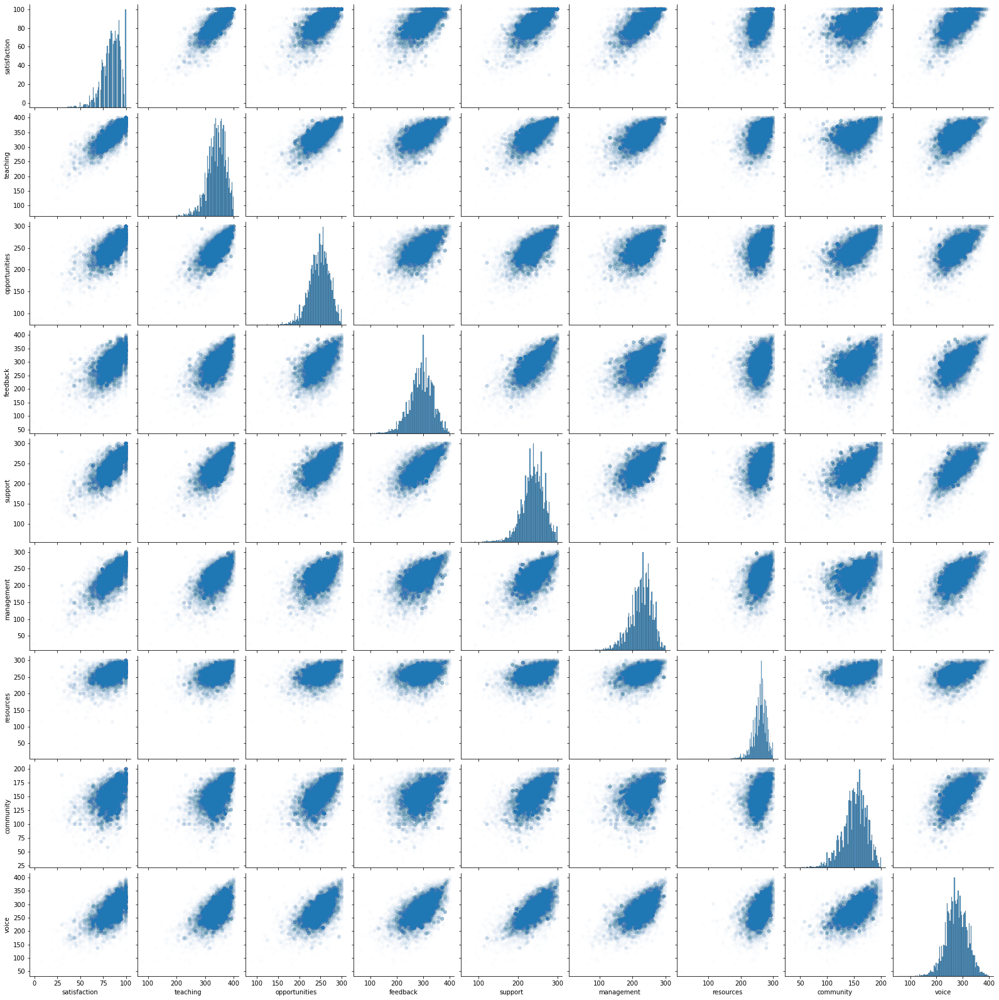

In [12]:
sns.pairplot(courses[['satisfaction','teaching','opportunities','feedback','support','management','resources','community','voice']], plot_kws=dict(alpha=.01, edgecolor='none'))

<AxesSubplot:>

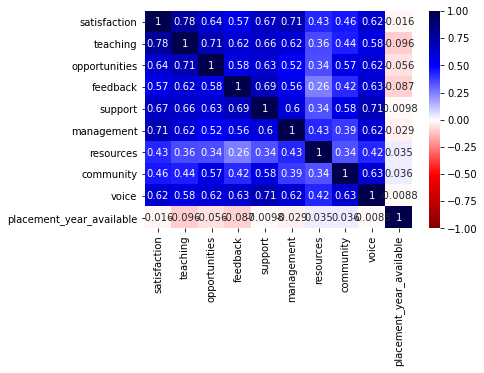

In [120]:
sns.heatmap(courses[['satisfaction','teaching','opportunities','feedback','support','management','resources','community','voice','placement_year_available']].corr(), cmap="seismic_r", annot=True, vmin=-1, vmax=1)



In [52]:
spending_df = pd.read_csv('dt025-table-17.csv')
spending_df['Total'] = pd.to_numeric(spending_df['Total'].str.replace(',',''))
spending_df = spending_df[spending_df['HE Provider']!='Total'][['UKPRN','Total']]

In [53]:
institutions['institution'] = pd.to_numeric(institutions['institution'])
institutions = institutions.merge(spending_df,how='left',left_on='institution',right_on='UKPRN')
institutions['institution'] = institutions['institution'].astype(str)
institutions

,institution,name,postcode,longitude,latitude,area,UKPRN_x,Total actual spend,UKPRN_y,Total
0,10008071,AA School of Architecture,WC1B3ES,-0.130697,51.518218,Camden,10008071.0,12.0,NaN,NaN
1,10000047,ABDO College of Education,CT47DT,0.952170,51.219855,Ashford,NaN,NaN,NaN,NaN
2,10007783,University of Aberdeen,AB243FX,-2.099122,57.165019,Aberdeen City,10007783.0,18955.0,10007783.0,985.0
3,10007849,Abertay University,DD11HG,-2.974299,56.463117,Dundee City,10007849.0,2885.0,10007849.0,185.0
4,10007856,Aberystwyth University,SY233BF,-4.067570,52.417469,Ceredigion,10007856.0,34257.0,10007856.0,430.0
...,...,...,...,...,...,...,...,...,...,...
438,10008914,Coleg Y Cymoedd,CF157QX,-3.276072,51.565596,Rhondda Cynon Taf,NaN,NaN,NaN,NaN
439,10007696,Yeovil College,BA214DR,-2.637780,50.948522,South Somerset,NaN,NaN,NaN,NaN
440,10007167,University of York,YO105DD,-1.053544,53.948419,York,10007167.0,25896.0,10007167.0,1595.0
441,10007709,York College,YO232BB,-1.113609,53.929705,York,NaN,NaN,NaN,NaN
